In [1]:
from transformers import T5ForConditionalGeneration, T5Tokenizer, AutoModelForCausalLM, AutoTokenizer 
import torch 
import nltk 
from diffusers import DiffusionPipeline

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0")

SEED = torch.manual_seed(336) 

2024-12-11 23:42:19.862862: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733982139.897373    3419 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733982139.907890    3419 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-11 23:42:19.949380: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [2]:
# Get 3 sentences or lesser from the generated prompt
def get_processed_prompt(text):
    sentences = nltk.sent_tokenize(text)
    return ' '.join(sentences[:2])
    
    #return text  #Testing without preprocessing the prompt

In [3]:
llm_args = {
    'max_length': 100,
    'no_repeat_ngram_size': 3,
    'temperature': 0.5,
    'top_p': 0.9,
    'top_k': 50,
    'do_sample': True
}

image_params = {'num_inference_steps':50, 
                'num_images_per_prompt':1,
                'generator':SEED, 
                'guidance_scale':5,
                'negative_prompt':"nonsense, bad, terrible, low quality, weird"}


In [4]:
input_text = "dog licking peanut butter" 

# GPT

In [5]:
model = AutoModelForCausalLM.from_pretrained('./fine_tuned_gpt') 
tokenizer = AutoTokenizer.from_pretrained('./fine_tuned_gpt') 


In [6]:
# Tokenize the input text
inputs = tokenizer(input_text, return_tensors="pt", padding=True, truncation=True)


In [7]:
#  Generate the output from the model
outputs = model.to(torch.device('cpu')).generate(
    input_ids=inputs['input_ids'],
    attention_mask=inputs['attention_mask'],
    **llm_args
)

gpt_generated_text = get_processed_prompt(tokenizer.decode(outputs[0], skip_special_tokens=True))

print(gpt_generated_text)


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


dog licking peanut butter with a light brown wooden spoon on top of a white wooden surface. The peanut butter is spread on a wooden surface with a small amount of brown peeling on the top and a small portion of brown chocolate chips. The bowl of the spoon is placed on a brown wooden surface and is facing the right side of the image. The spoon is facing to the right. The brown wooden bowl is placed next to a wooden table with a white plastic bowl on the left side of it.


In [8]:
gpt_image = pipe.to(torch.device('cuda'))(gpt_generated_text, **image_params).images[0] 

Token indices sequence length is longer than the specified maximum sequence length for this model (101 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['. the brown wooden bowl is placed next to a wooden table with a white plastic bowl on the left side of it.']
Token indices sequence length is longer than the specified maximum sequence length for this model (101 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['. the brown wooden bowl is placed next to a wooden table with a white plastic bowl on the left side of it.']


  0%|          | 0/50 [00:00<?, ?it/s]

## GPT on new data

In [9]:
model = AutoModelForCausalLM.from_pretrained('./fine_tuned_gpt_new_data') 
tokenizer = AutoTokenizer.from_pretrained('./fine_tuned_gpt_new_data') 


In [10]:
# Tokenize the input text
inputs = tokenizer(input_text, return_tensors="pt", padding=True, truncation=True)


In [11]:
#  Generate the output from the model
outputs = model.to(torch.device('cpu')).generate(
    input_ids=inputs['input_ids'],
    attention_mask=inputs['attention_mask'],
    **llm_args
)

new_gpt_generated_text = get_processed_prompt(tokenizer.decode(outputs[0], skip_special_tokens=True))

print(new_gpt_generated_text)


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


dog licking peanut butter, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse mucha


In [12]:
new_gpt_image = pipe.to(torch.device('cuda'))(new_gpt_generated_text, 
                                              **image_params).images[0] 

  0%|          | 0/50 [00:00<?, ?it/s]

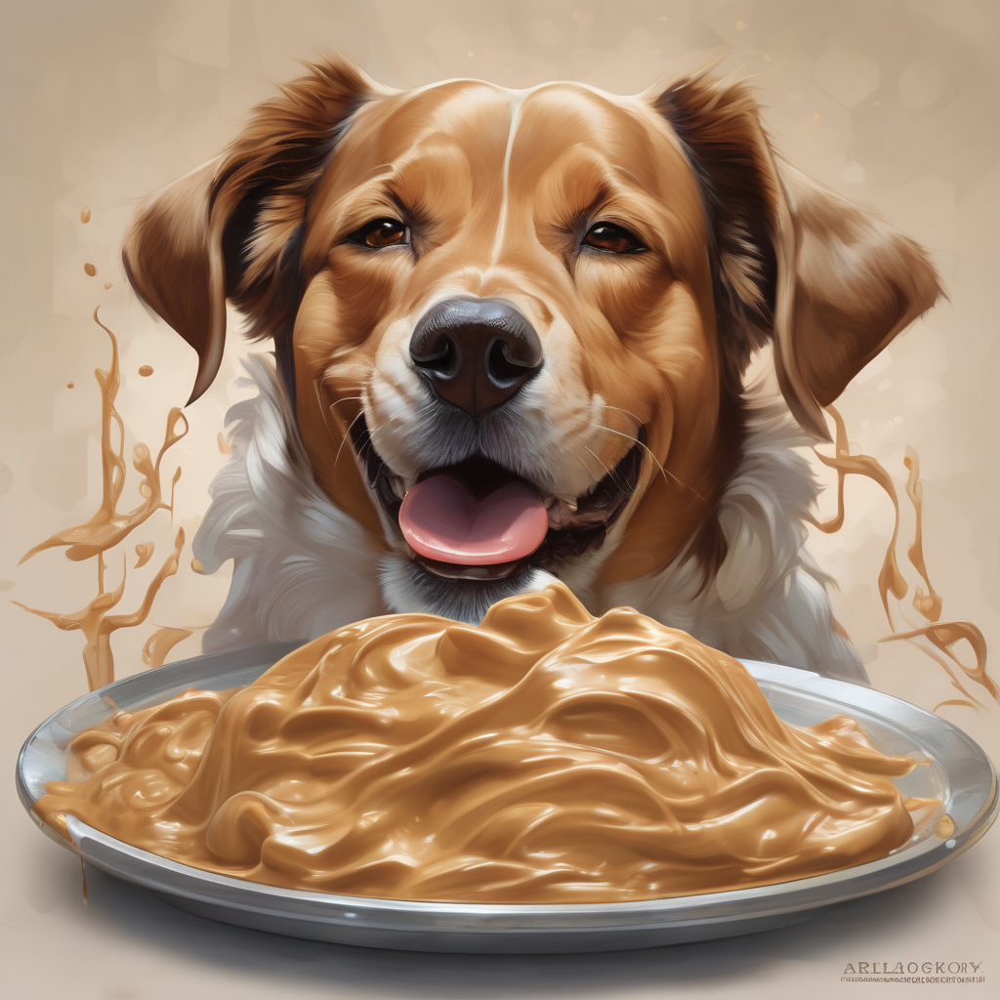

In [13]:
new_gpt_image

# T5

In [14]:
t5model = T5ForConditionalGeneration.from_pretrained('./fine_tuned_t5') 
t5tokenizer = T5Tokenizer.from_pretrained('./fine_tuned_t5') 

In [15]:
t5_input = f"Enhance this prompt to make it a better input for Stable Diffusion: {input_text}"

In [16]:
# Tokenize the input text
inputs = t5tokenizer(input_text, return_tensors="pt", padding=True, truncation=True)

In [17]:
#  Generate the output from the model
outputs = t5model.to(torch.device('cpu')).generate(
    input_ids=inputs['input_ids'],
    attention_mask=inputs['attention_mask'],
    **llm_args
)

t5_generated_text = get_processed_prompt(t5tokenizer.decode(outputs[0], skip_special_tokens=True))

print(t5_generated_text)


A dog licking peanut butter on a dog's peanut butter and licks it. The dog' s peanuts are a little too soft. The dogs are licky and a bit too thin. The puppy's dog is lick-up with a peanut butter peanut butter butter. The peanut butter is a butternut butter peanut. The animal is lilacing the peanut butter. It is slicking the dog'


In [18]:
t5_image = pipe.to(torch.device('cuda'))(t5_generated_text, **image_params).images[0]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["the dog '"]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["the dog '"]


  0%|          | 0/50 [00:00<?, ?it/s]

KeyboardInterrupt: 

: 

In [ ]:
t5_image

## Original image

In [19]:
og_image = pipe.to(torch.device('cuda'))(input_text, **image_params).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

## All images

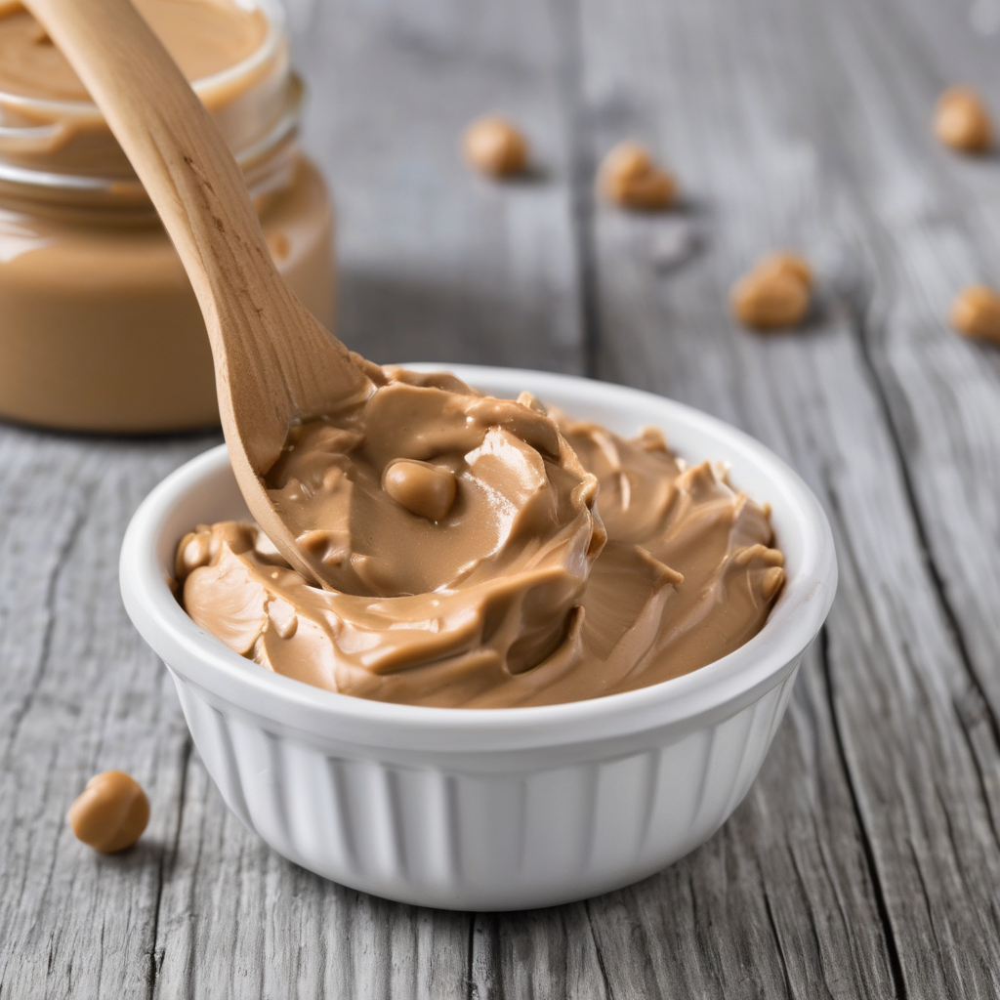

In [20]:
gpt_image 

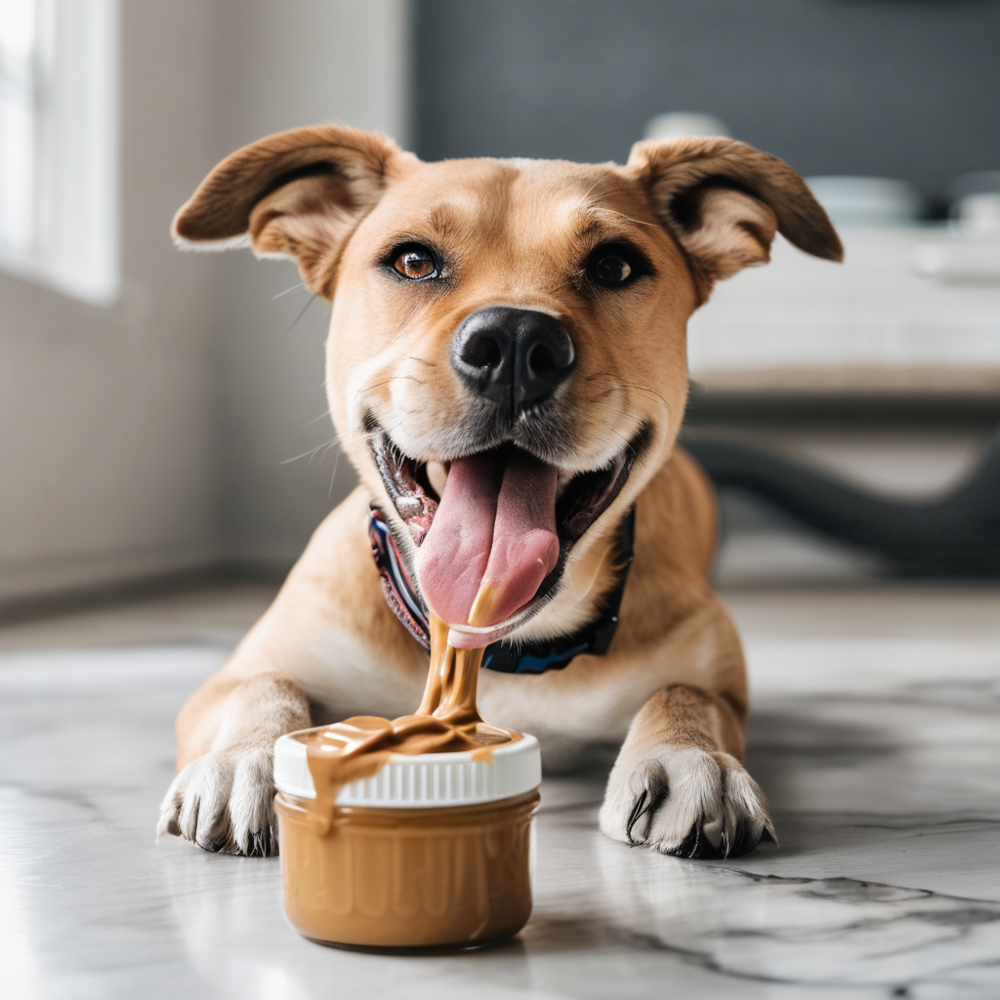

In [21]:
og_image

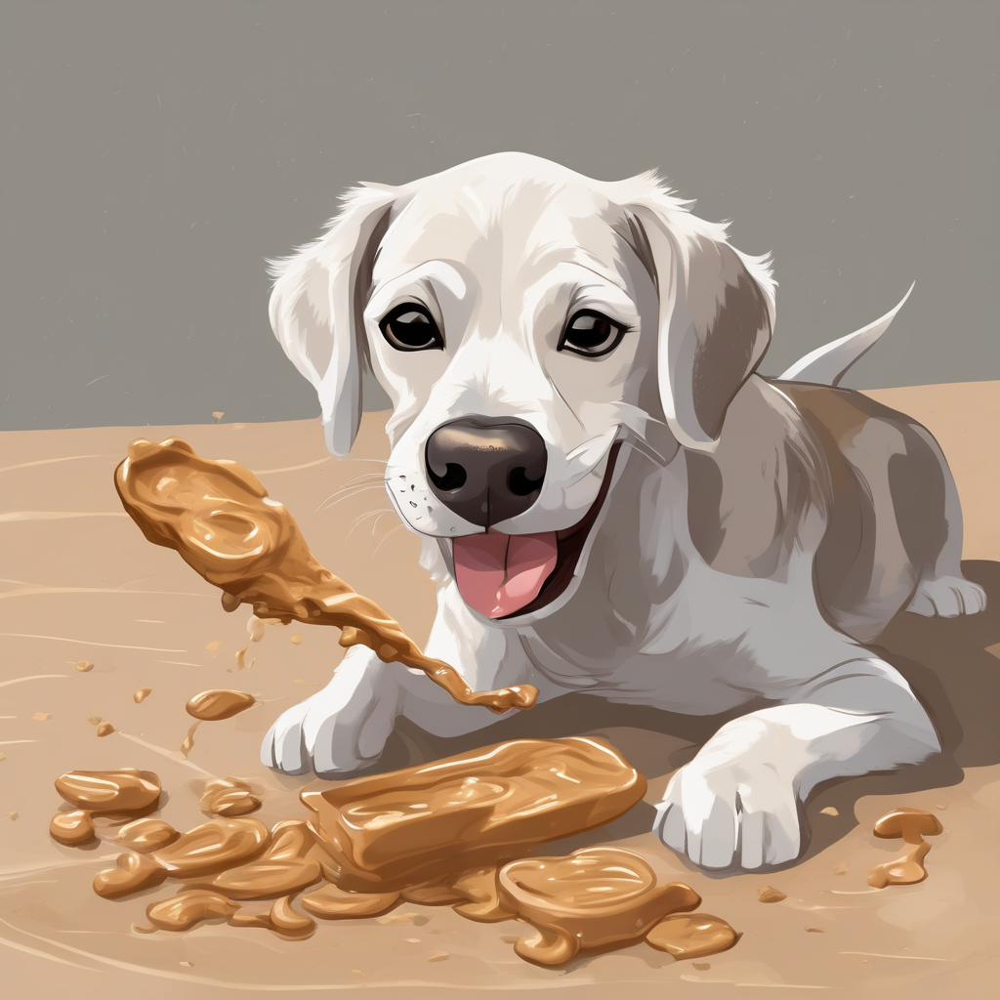

In [22]:
t5_image

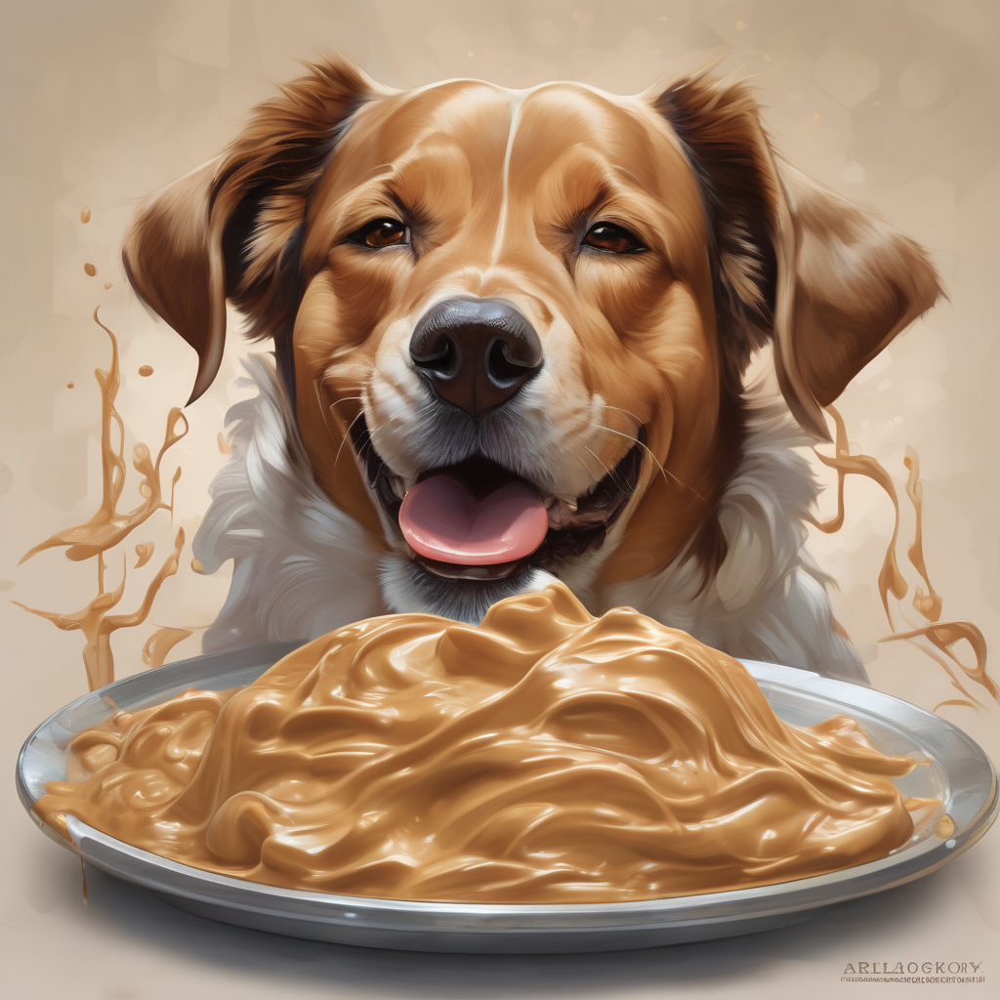

In [23]:
new_gpt_image 